In [75]:
import numpy as np
import pandas as pd
from time import time
from sklearn import metrics
from collections import defaultdict
import matplotlib.pyplot as plt
import glob
import seaborn as sns


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics.cluster import contingency_matrix, homogeneity_score, completeness_score, adjusted_rand_score, adjusted_mutual_info_score, v_measure_score
from sklearn.metrics.cluster import contingency_matrix

## profiling
from pandas_profiling import ProfileReport
%matplotlib inline

## Gas Turbine CO and NOx Emission Data Set

In [76]:
path = 'pp_gas_emission/'
all_files = glob.glob(path + "/*.csv")
li = []
years = []
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    df['year'] = int(filename[-8:-4])
    years.append(int(int(filename[-8:-4])))
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

## predict the criteria pollutants in a particular region - CO

## Standardize feature columns 

In [77]:
frame.drop('NOX',axis =1,inplace=True)

### One hot encode the year column (doesn't work for profiler) [Categorical Data]

In [78]:
one_hot = pd.get_dummies(frame['year'])
frame_catdata = frame.drop('year',axis=1)
frame_catdata = frame.join(one_hot)

In [79]:
frame['year_cat'] =  frame['year'].astype('category')

In [80]:
def standardize_dataset(full_df):
    scaler = preprocessing.StandardScaler()
    full_df_stand = full_df.copy(deep=True)
    full_df_stand[num_feature_columns] = scaler.fit_transform(full_df_stand[num_feature_columns])
    return full_df_stand

### Set the feature columns

In [81]:
feature_columns = list(frame.columns)
feature_columns = list(set(feature_columns) - set(['NOX','CO','year']))
num_feature_columns = list(set(feature_columns)-set(['year_cat']))
num_feature_and_he_columns = list(set(frame_catdata.columns)- set(['NOX','CO','year']))
num_feature_and_cat_columns = list(set(frame.columns)- set(['NOX','CO','year']))
num_feature_and_year_columns = list(set(frame.columns)- set(['NOX','CO','year_cat']))

In [90]:
profile = ProfileReport(frame[feature_columns], title="frame Profiling Report",explorative=True)

In [58]:
profile.to_file("gas_report.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 102.40it/s]


In [91]:
profile

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]


## Q4 Construct and inspect the box plot of categorical features vs target variable. What do you find?

In [45]:
def box_plot(feature,target,df_data):
    fig, ax1  = plt.subplots(figsize=(7, 5))

    #feature = 'carat'
    #target = 'price'
    title_name = str(feature) + ' vs ' + target

    props = dict(widths=0.8,patch_artist=True, medianprops=dict(color="gold"))
    box1=ax1.boxplot(df_data[feature], positions=[0], **props)

    ax2 = ax1.twinx()
    box2=ax2.boxplot(df_data[target],positions=[1], **props)

    # ax1.set_xticks(range(len(df.columns)))
    # ax1.set_xticklabels(df.columns)

    for b in box1["boxes"]+box2["boxes"]:
        b.set_facecolor(next(ax1._get_lines.prop_cycler)["color"])
    plt.title(title_name)
    plt.show()

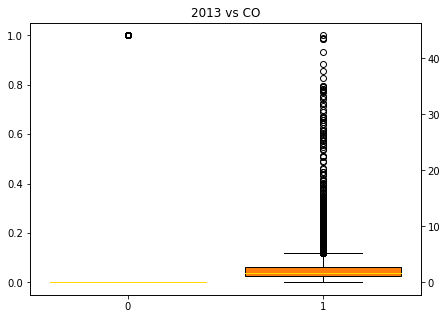

In [185]:
# for feature in num_feature_columns:
box_plot(2013,'CO',frame_catdata)

## Standardizing columns

In [82]:
frame_standardized = standardize_dataset(frame)

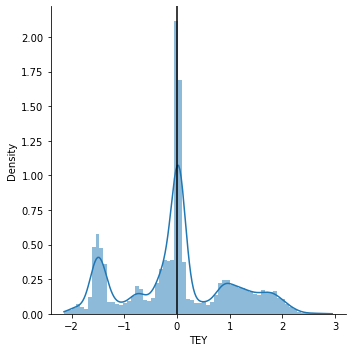

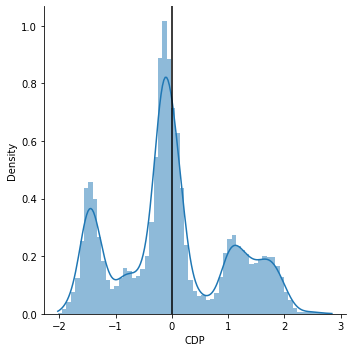

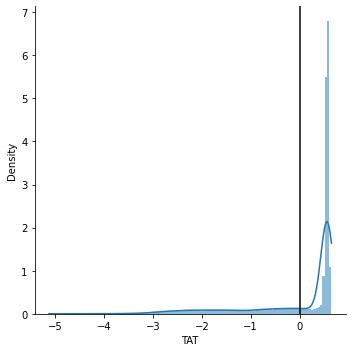

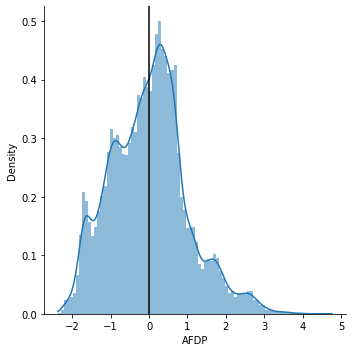

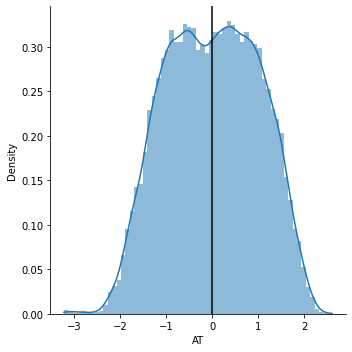

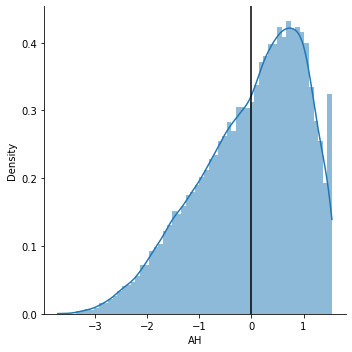

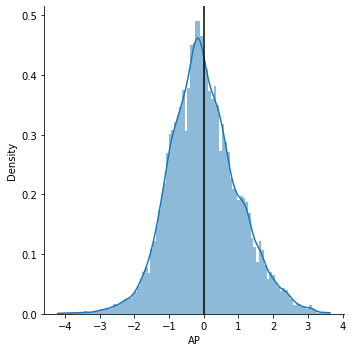

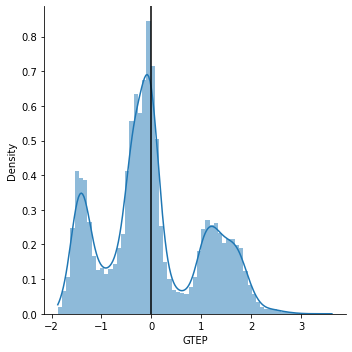

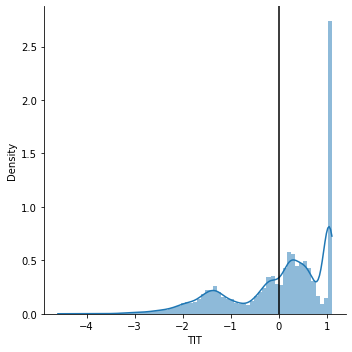

In [26]:
# Distribution Plots with standardized columns
num = frame_standardized.select_dtypes(include=np.number)  # Get numeric columns
n = num.shape[1]  # Number of cols
for  col in  num:  # For each column...
    sns.displot(num[col],kde=True, stat="density", linewidth=0)   # Plot histogaerm
    plt.axvline(num[col].mean(), c='k')  # Plot mean

## Q3 Plot the histogram of numerical features. What preprocessing can be done if the distribution of a feature has high skewness?
 Tackling Skewness (nothing works :/)

In [11]:
def plot_column(column):
    sns.displot(column,kde=True, stat="density", linewidth=0)   # Plot histogaerm
    plt.axvline(column.mean(), c='k')

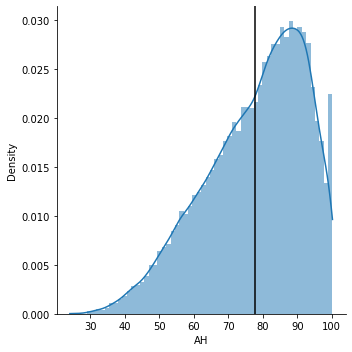

In [24]:
plot_column(frame['AH'])

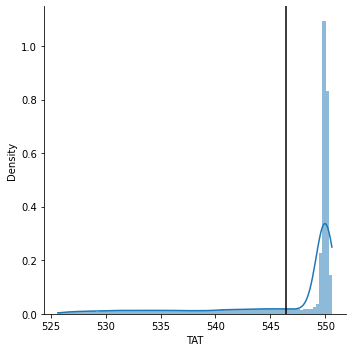

In [23]:
## take only datapoints that lie within 3 std of the mean 
from scipy import stats
std_dev = 3
plot_column(frame['TAT'][(np.abs(stats.zscore(frame['TAT'])) < float(std_dev))])

## Q6 Yearly trends
plot the yearly trends for each feature and compare
them.

In [12]:
def plot_timeseries(column_name):
    ax = frame.loc[frame['year']==2013][column_name].plot(figsize=(10,10))
    for year in years:
        frame.loc[frame['year']==year].reset_index()[column_name].plot(figsize=(10,10),ax =ax)
    ax.legend(years)
    ax.set_xlabel('Time')
    ax.set_ylabel(column_name)
    return 

### run per column for all timeseries plots

In [229]:
num_feature_columns

['AH', 'AT', 'AFDP', 'TIT', 'TEY', 'AP', 'CDP', 'TAT', 'GTEP']

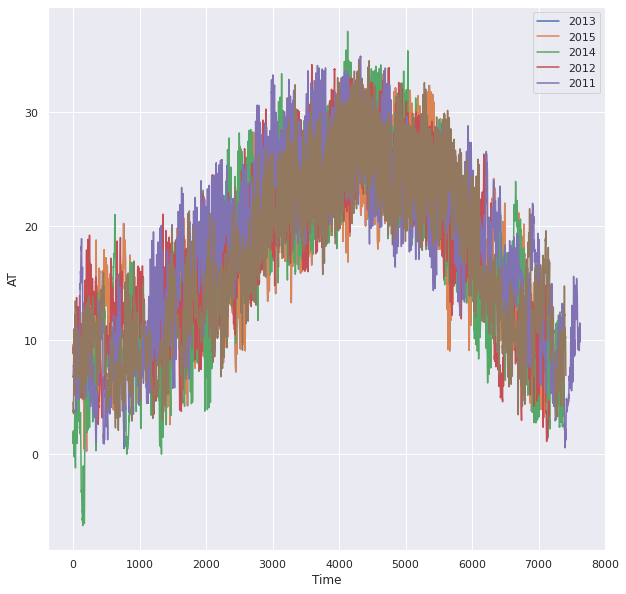

In [ ]:
plot_timeseries('AT')

## Q7 Feature Selection 

In [83]:
from sklearn.feature_selection import mutual_info_regression 
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import RepeatedKFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

In [84]:
def tonparray(df,feature_columns,target):
    X = df[feature_columns].values
    y = df[target].values
    return X, y

In [85]:
# df_mi = pd.DataFrame(mi_reg( frame['CO'],frame[num_feature_columns]), index = num_feature_columns).apply(lambda x: x / x.max(), axis = 1)

def select_features(df,feature_columns,target,num_of_features='all'):
    train, test = train_test_split(df, test_size=0.2)

    X_train = train[feature_columns].values
    y_train = train[target].values
    X_test = test[feature_columns].values
    y_test = test[target].values

    fs = SelectKBest(score_func=mutual_info_regression, k=num_of_features)
    fs.fit(X_train,y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)

    inc_nuinfo_features_num = [feature_columns[i] for i in np.argsort(fs.scores_)]

    return inc_nuinfo_features_num

In [86]:
inc_nuinfo_features_num = select_features(frame_standardized,num_feature_and_cat_columns,'CO')

In [51]:
def compute_rmse_for_features(feature_columns,full_df, standardize =False):
    if standardize is True: 
        df = standardize_dataset(full_df)   
    else:
        df = full_df


    X = df[feature_columns].values
    y = df['CO'].values
    
    regression = LinearRegression()
    scoring_para = 'neg_root_mean_squared_error'
    scores = cross_val_score(regression, X, y,cv =10, scoring=scoring_para)
    return scores.mean()


In [52]:
inc_nuinfo_features_num

['AH', 'AP', 'AT', 'year_cat', 'TAT', 'AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [169]:
num_features=[]
for i in range(1,len(inc_nuinfo_features_num)+1):
    num_features.append(compute_rmse_for_features(inc_nuinfo_features_num[-i:],frame,standardize=True))
print(np.argmax(num_features))

2


In [ ]:
dict(zip(num_feature_columns,fs.scores_))

{'TEY': 0.49561789002498546,
 'CDP': 0.47229834963763917,
 'TAT': 0.15799763070411998,
 'AFDP': 0.27839019334468684,
 'AT': 0.10793645701283694,
 'AH': 0.022187799028607458,
 'AP': 0.045358869959645,
 'GTEP': 0.44714891679077784,
 'TIT': 0.5358247408137897}

### Gridsearch number of features value for standardized and non_standardized dataframe (numerical features)
Standardizing numerical features or not, the number of features considered important, using the Mutual Information Score to rank them, and pick the ones with the highest score, yielded a lowest RMSE error when all the 9 features are considered at once

In [ ]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.492
Best Config: {'sel__k': 9}
>-1.598 with: {'sel__k': 1}
>-1.548 with: {'sel__k': 2}
>-1.512 with: {'sel__k': 3}
>-1.512 with: {'sel__k': 4}
>-1.511 with: {'sel__k': 5}
>-1.499 with: {'sel__k': 6}
>-1.495 with: {'sel__k': 7}
>-1.495 with: {'sel__k': 8}
>-1.492 with: {'sel__k': 9}


In [ ]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_standardized_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.490
Best Config: {'sel__k': 9}
>-1.596 with: {'sel__k': 1}
>-1.546 with: {'sel__k': 2}
>-1.510 with: {'sel__k': 3}
>-1.510 with: {'sel__k': 4}
>-1.509 with: {'sel__k': 5}
>-1.497 with: {'sel__k': 6}
>-1.493 with: {'sel__k': 7}
>-1.493 with: {'sel__k': 8}
>-1.490 with: {'sel__k': 9}


In [45]:
dict(zip(num_feature_columns,fs.scores_))

{'TEY': 0.49561789002498546,
 'CDP': 0.47229834963763917,
 'TAT': 0.15799763070411998,
 'AFDP': 0.27839019334468684,
 'AT': 0.10793645701283694,
 'AH': 0.022187799028607458,
 'AP': 0.045358869959645,
 'GTEP': 0.44714891679077784,
 'TIT': 0.5358247408137897}

In [101]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.492
Best Config: {'sel__k': 9}
>-1.598 with: {'sel__k': 1}
>-1.548 with: {'sel__k': 2}
>-1.512 with: {'sel__k': 3}
>-1.512 with: {'sel__k': 4}
>-1.511 with: {'sel__k': 5}
>-1.499 with: {'sel__k': 6}
>-1.495 with: {'sel__k': 7}
>-1.495 with: {'sel__k': 8}
>-1.492 with: {'sel__k': 9}


In [104]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_standardized_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.490
Best Config: {'sel__k': 9}
>-1.596 with: {'sel__k': 1}
>-1.546 with: {'sel__k': 2}
>-1.510 with: {'sel__k': 3}
>-1.510 with: {'sel__k': 4}
>-1.509 with: {'sel__k': 5}
>-1.497 with: {'sel__k': 6}
>-1.493 with: {'sel__k': 7}
>-1.493 with: {'sel__k': 8}
>-1.490 with: {'sel__k': 9}


## Linear Regression

In [87]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter("ignore", category=ConvergenceWarning)

In [88]:
import statsmodels.api as sm
from scipy import stats

In [29]:
frame_standardized_he = standardize_dataset(frame_catdata) #hotnecoded

In [35]:
X_pval = frame_standardized_he[num_feature_columns]
y_pval = frame_standardized_he['CO']

In [36]:
X2 = sm.add_constant(X_pval)
est = sm.OLS(y_pval, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                     CO   R-squared:                       0.563
Model:                            OLS   Adj. R-squared:                  0.563
Method:                 Least Squares   F-statistic:                     5266.
Date:                Tue, 15 Mar 2022   Prob (F-statistic):               0.00
Time:                        15:21:46   Log-Likelihood:                -66893.
No. Observations:               36733   AIC:                         1.338e+05
Df Residuals:                   36723   BIC:                         1.339e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3725      0.008    304.108      0.0

## Choosing regularization Parameter for Ridge and Lasso regressions

In [43]:
def eval_models_regularization(df,feature_columns,target):
    X = df[feature_columns].values
    y = df[target].values
    for Model in [Ridge, Lasso]:
        model = Model()
        print('Default params %s: %s' % (Model.__name__,
                        cross_val_score(model, X, y).mean()))

    alphas = np.logspace(-3, 1, 50)

    plt.figure(figsize=(5, 3))

    for Model in [Lasso, Ridge]:
        scores = [cross_val_score(Model(alpha), X, y, cv=10,scoring='neg_root_mean_squared_error').mean()
                for alpha in alphas]
        print("Optimal Alpha {}".format(alphas[np.argmax(scores)]))
        plt.plot(alphas, scores, label=Model.__name__)

    plt.legend(loc='lower left')
    plt.xlabel('alpha')
    plt.ylabel('cross validation score')
    plt.tight_layout()
    plt.show()

Default params Ridge: 0.4264416132059276
Default params Lasso: 0.2229372122225513
Optimal Alpha 0.0625055192527397
Optimal Alpha 6.866488450042998


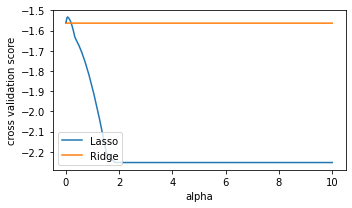

In [45]:
# numerical features
eval_models_regularization(frame_standardized,num_feature_columns,'CO')

### Q8 Explain how each regularization scheme affects the learned hypotheses
#### LASSO
#### RIDGE

### Q9 Report your choice of the best regularization scheme along with the optimal penalty parameter and briefly explain how it can be computed
GridSearch across Lasso and ridge with alpha values for a given number of features selected for standardized and unstandardized data

In [90]:
ridge = Ridge()
grid = dict()
grid['alpha'] = np.arange(0, 1, 0.01)
search = GridSearchCV(ridge, grid, scoring='neg_root_mean_squared_error', cv=10, n_jobs=-1)
results = search.fit(X_num_full, y_num_full)

In [52]:
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_train)

yhat = model.predict(X_test_fs)
# evaluate predictions
mae = metrics.mean_squared_error(y_test, yhat,squared=False)
print('RMSE: %.3f' % mae)

RMSE: 1.563


In [53]:
regr.fit(frame['AT'].values.reshape(-1,1),frame['CO'])

LinearRegression()

In [ ]:
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = metrics.mean_squared_error(y_test, yhat,squared=False)
print('RMSE: %.3f' % mae)

In [ ]:
cv = KFold(n_splits=10, random_state=1, shuffle=True)
scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)

## Polynomial Regression

In [89]:
from sklearn.preprocessing import PolynomialFeatures

### Q12 Salient Features 

In [56]:
poly_regression(3,frame_standardized,'CO',inc_nuinfo_features_num[-3:])

{'fit_time': array([0.01399755, 0.03168106, 0.04633975, 0.03381944, 0.03775311]),
 'score_time': array([0.00909305, 0.00326896, 0.0059309 , 0.00523806, 0.00322223]),
 'test_score': array([-1.4591755 , -1.64282886, -1.66864175, -1.36664601, -1.52617286]),
 'train_score': array([-1.3444097 , -1.30350825, -1.32499698, -1.36038985, -1.34233718])}

In [90]:
def poly_regression(degree,df,target_column,feature_columns):
    x_poly_train=PolynomialFeatures(degree=degree).fit_transform(df[feature_columns])
    lr=LinearRegression(fit_intercept=False)
    cve=cross_validate(lr,x_poly_train,df[target_column],scoring='neg_root_mean_squared_error',cv=5,return_train_score=True)
    return cve


### Q13 What degree of polynomial is best?

In [49]:
def choose_poly_degree(df,target_column,feature_columns):
    maxdegree=7 
    cross_validation_error=[]
    training_error = []
    for deg in range(1,maxdegree):
        cve = poly_regression(deg,df,target_column,feature_column)
        training_error.append(np.mean(np.absolute(cve['train_score'])))
        cross_validation_error.append(np.mean(np.absolute(cve['test_score'])))    
    return cross_validation_error, training_error

In [33]:
def plot_error_vs_degree(maxdegree,error_list):
    fig,ax=plt.subplots(figsize=(6,6))
    ax.plot(range(1,maxdegree),error_list)
    ax.set_xlabel('Degree',fontsize=15)
    ax.set_ylabel('RMSE',fontsize=15)
    ax.set_title('RMSE VS Degree',fontsize=25)

In [93]:
def PolynomialFeatures_labeled(input_df,input_feature_names,target,power):
    '''Basically this is a cover for the sklearn preprocessing function. 
    The problem with that function is if you give it a labeled dataframe, it ouputs an unlabeled dataframe with potentially
    a whole bunch of unlabeled columns. 
    Inputs:
    input_df = Your labeled pandas dataframe (list of x's not raised to any power) 
    power = what order polynomial you want variables up to. (use the same power as you want entered into pp.PolynomialFeatures(power) directly)
    Ouput:
    Output: This function relies on the powers_ matrix which is one of the preprocessing function's outputs to create logical labels and 
    outputs a labeled pandas dataframe   
    '''
    poly = PolynomialFeatures(power)
    output_nparray = poly.fit_transform(input_df[input_feature_names])
    powers_nparray = poly.powers_

    # input_feature_names = list(input_df.columns)
    target_feature_names = [target]
    for feature_distillation in powers_nparray[1:]:
        intermediary_label = ""
        final_label = ""
        for i in range(len(input_feature_names)):
            if feature_distillation[i] == 0:
                continue
            else:
                variable = input_feature_names[i]
                power = feature_distillation[i]
                intermediary_label = "%s^%d" % (variable,power)
                if final_label == "":         #If the final label isn't yet specified
                    final_label = intermediary_label
                else:
                    final_label = final_label + " x " + intermediary_label
        target_feature_names.append(final_label)
    output_df = pd.DataFrame(output_nparray, columns = target_feature_names)
    return output_df

In [94]:
output_df = PolynomialFeatures_labeled(frame_standardized,num_feature_columns,'CO',2)

In [100]:
inc_nuinfo_features_num

['AH', 'AP', 'AT', 'year_cat', 'TAT', 'AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [95]:
output_df

,CO,AP^1,AFDP^1,TAT^1,TEY^1,CDP^1,AT^1,AH^1,TIT^1,GTEP^1,...,AH^2,AH^1 x TIT^1,AH^1 x GTEP^1,AH^1 x CO^1,TIT^2,TIT^1 x GTEP^1,TIT^1 x CO^1,GTEP^2,GTEP^1 x CO^1,CO^2
0,1.0,1.087661,-1.980576,-0.730535,-1.494799,-1.374497,-1.119167,0.857123,-2.157151,-1.524774,...,0.734659,-1.848942,-1.306918,8.011696,4.653299,3.289168,-20.163319,2.324937,-14.252371,87.370148
1,1.0,1.056717,-2.005773,-1.054989,-1.554344,-1.367149,-1.129828,0.834441,-2.368144,-1.535976,...,0.696292,-1.976076,-1.281681,9.192203,5.608104,3.637411,-26.087470,2.359222,-16.920309,121.352256
2,1.0,1.041245,-1.990009,-0.977529,-1.529374,-1.393784,-1.151957,0.829877,-2.305416,-1.521914,...,0.688696,-1.913212,-1.263002,8.921179,5.314943,3.508646,-24.783222,2.316224,-16.360580,115.562500
3,1.0,0.963885,-1.993756,-1.354597,-1.576754,-1.471853,-1.173736,0.803738,-2.527814,-1.521438,...,0.645995,-2.031700,-1.222838,9.875531,6.389843,3.845912,-31.059249,2.314773,-18.693906,150.970369
4,1.0,0.932940,-1.965459,-0.717382,-1.499281,-1.466343,-1.167801,0.776700,-2.162853,-1.515241,...,0.603263,-1.679889,-1.176888,7.629448,4.677934,3.277244,-21.245491,2.295956,-14.884063,96.489364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36728,1.0,-1.155789,-0.495420,0.007524,-1.401960,-1.525124,-1.165868,1.424020,-1.809297,-1.525251,...,2.027834,-2.576477,-2.171989,6.434579,3.273557,2.759633,-8.175492,2.326391,-6.891999,20.417746
36729,1.0,-1.109373,-0.542194,-0.429465,-1.391075,-1.494815,-1.319238,1.467793,-2.003183,-1.465669,...,2.154416,-2.940258,-2.151299,7.114392,4.012742,2.936003,-9.709427,2.148186,-7.104098,23.493409
36730,1.0,-1.047485,-0.579536,-1.291753,-1.492878,-1.448892,-1.402919,1.495661,-2.493599,-1.438023,...,2.237001,-3.729578,-2.150794,11.910245,6.218035,3.585853,-19.857026,2.067910,-11.451265,63.412554
36731,1.0,-0.970125,-0.616232,-0.718843,-1.457664,-1.402969,-1.437656,1.461915,-2.179961,-1.474487,...,2.137196,-3.186917,-2.155575,9.136092,4.752229,3.214324,-13.623446,2.174113,-9.214660,39.055000


## Bayesian Optimization: LightGBM and CatBoost 

In [66]:
import lightgbm as lgb 
import pprint
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

### LightGBM

In [42]:
X_train, X_test, y_train, y_test = train_test_split(frame_standardized[num_feature_and_cat_columns], frame_standardized['CO'], test_size=0.3,random_state=42)

train_lgb = lgb.Dataset(X_train, y_train)
eval_lgb = lgb.Dataset(X_test, y_test, reference = train_lgb)


In [ ]:
params = { 'objective': 'regression',
  'metric': 'RMSE',
  'learning_rate': 0.02}
lgb_reg = lgb.train(params, train_lgb, num_boost_round = 10000, early_stopping_rounds=50, verbose_eval = 100, valid_sets=eval_lgb)

In [56]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title="model", callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    
    if callbacks is not None:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
        
    d=pd.DataFrame(optimizer.cv_results_)
    best_score = optimizer.best_score_
    best_score_std = d.iloc[optimizer.best_index_].std_test_score
    best_params = optimizer.best_params_
    
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           + u"\u00B1"+" %.3f") % (time() - start, 
                                   len(optimizer.cv_results_['params']),
                                   best_score,
                                   best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()

In [57]:
# rmse = mean_squared_error(squared=False)
# roc_auc = make_scorer(roc_auc_score, greater_is_better=True, needs_threshold=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
lgbregr = lgb.LGBMRegressor(boosting_type='gbdt',
                         metric='root_mean_squared_error',
                         n_jobs=1, 
                         verbose=-1,
                         random_state=42)

In [58]:
search_spaces = {
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),     # Boosting learning rate
    'n_estimators': Integer(30, 5000),                   # Number of boosted trees to fit
    'num_leaves': Integer(2, 512),                       # Maximum tree leaves for base learners
    'max_depth': Integer(-1, 256),                       # Maximum tree depth for base learners, <=0 means no limit
    'min_child_samples': Integer(1, 256),                # Minimal number of data in one leaf
    'max_bin': Integer(100, 1000),                       # Max number of bins that feature values will be bucketed
    'subsample': Real(0.01, 1.0, 'uniform'),             # Subsample ratio of the training instance
    'subsample_freq': Integer(0, 10),                    # Frequency of subsample, <=0 means no enable
    'colsample_bytree': Real(0.01, 1.0, 'uniform'),      # Subsample ratio of columns when constructing each tree
    'min_child_weight': Real(0.01, 10.0, 'uniform'),     # Minimum sum of instance weight (hessian) needed in a child (leaf)
    'reg_lambda': Real(1e-9, 100.0, 'log-uniform'),      # L2 regularization
    'reg_alpha': Real(1e-9, 100.0, 'log-uniform'),       # L1 regularization
    'scale_pos_weight': Real(1.0, 500.0, 'uniform'),     # Weighting of the minority class (Only for binary classification)
        }

In [59]:
opt_lgb = BayesSearchCV(estimator=lgbregr,                                    
                    search_spaces=search_spaces,                      
                    scoring='neg_root_mean_squared_error',                                  
                    cv=5,                                           
                    n_iter=3000,                                      # max number of trials
                    n_points=3,                                       # number of hyperparameter sets evaluated at the same time
                    n_jobs=-1,                                        # number of jobs
                    iid=False,                                        # if not iid it optimizes on the cv score
                    return_train_score=False,                         
                    refit=False,                                      
                    optimizer_kwargs={'base_estimator': 'GP'},        # optmizer parameters: we use Gaussian Process (GP)
                    random_state=0)                                   # random state for replicability


/home/anw/ucla_coursework/219/code/ECE219_data_mining_project/env219/lib/python3.8/site-packages/skopt/searchcv.py:300: UserWarning: The `iid` parameter has been deprecated and will be ignored.
  warnings.warn("The `iid` parameter has been deprecated "


In [60]:
X = frame_standardized[num_feature_and_cat_columns]
y = frame_standardized['CO']

In [75]:
overdone_control = DeltaYStopper(delta=0.0001)               # We stop if the gain of the optimization becomes too small
time_limit_control = DeadlineStopper(total_time=60 * 45)     # We impose a time limit (45 minutes)

best_params = report_perf(opt_lgb, X, y,'LightGBM', 
                          callbacks=[overdone_control, time_limit_control])

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

### Catboost 

In [61]:
import catboost as cb

In [62]:
catboostregr = cb.CatBoostRegressor(loss_function='RMSE',cat_features=['year_cat'])

In [63]:
search_spaces_cb = {'iterations': Integer(10, 1000),
                    'depth': Integer(1, 8),
                    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                    'random_strength': Real(1e-9, 10, 'log-uniform'),
                    'bagging_temperature': Real(0.0, 1.0),
                    'border_count': Integer(1, 255),
                    'l2_leaf_reg': Integer(2, 30)}#,
                    # 'scale_pos_weight':Real(0.01, 1.0, 'uniform')}

In [64]:
opt_cb = BayesSearchCV(estimator=catboostregr,                                    
                    search_spaces=search_spaces_cb,                      
                    scoring='neg_root_mean_squared_error',                                  
                    cv=5,                                           
                    n_iter=3000,                                      # max number of trials
                    n_points=3,                                       # number of hyperparameter sets evaluated at the same time
                    n_jobs=1,                                        # number of jobs
                    iid=False,                                        # if not iid it optimizes on the cv score
                    return_train_score=False,                         
                    refit=False,                                      
                    optimizer_kwargs={'base_estimator': 'GP'},        # optmizer parameters: we use Gaussian Process (GP)
                    random_state=42)                                   # random state for replicability


/home/anw/ucla_coursework/219/code/ECE219_data_mining_project/env219/lib/python3.8/site-packages/skopt/searchcv.py:300: UserWarning: The `iid` parameter has been deprecated and will be ignored.
  warnings.warn("The `iid` parameter has been deprecated "


In [67]:
overdone_control = DeltaYStopper(delta=0.0001)               # We stop if the gain of the optimization becomes too small
time_limit_control = DeadlineStopper(total_time=60 * 10)     # We impose a time limit (45 minutes)

best_params = report_perf(opt_cb, X, y,'CatBoost', 
                          callbacks=[overdone_control, time_limit_control])

0:	learn: 2.1431761	total: 11.2ms	remaining: 3.61s
1:	learn: 2.0668960	total: 21.7ms	remaining: 3.49s
2:	learn: 1.9944907	total: 32ms	remaining: 3.42s
3:	learn: 1.9303368	total: 42.9ms	remaining: 3.42s
4:	learn: 1.8709275	total: 54.4ms	remaining: 3.46s
5:	learn: 1.8153726	total: 64.9ms	remaining: 3.43s
6:	learn: 1.7638692	total: 73.6ms	remaining: 3.32s
7:	learn: 1.7152967	total: 80.8ms	remaining: 3.18s
8:	learn: 1.6723920	total: 90.4ms	remaining: 3.15s
9:	learn: 1.6305532	total: 97.9ms	remaining: 3.06s
10:	learn: 1.5913535	total: 106ms	remaining: 3.01s
11:	learn: 1.5586847	total: 114ms	remaining: 2.96s
12:	learn: 1.5273990	total: 125ms	remaining: 2.97s
13:	learn: 1.4982501	total: 134ms	remaining: 2.96s
14:	learn: 1.4714692	total: 142ms	remaining: 2.91s
15:	learn: 1.4465836	total: 150ms	remaining: 2.87s
16:	learn: 1.4236844	total: 159ms	remaining: 2.85s
17:	learn: 1.4018467	total: 167ms	remaining: 2.83s
18:	learn: 1.3816906	total: 176ms	remaining: 2.81s
19:	learn: 1.3629632	total: 184ms